# Chapter 14: Machine Learning 1: Color-Coding Cambridge

0. Come in. Sit down. Open Teams. 
1. Open up the Jupyter Lab session request menu.
2. Today's custom `conda` environment is `/courses/PHYS7332.202510/shared/sad-ml/`. Make sure you've indicated you're using this environment in the dialog box for `Name of Custom Conda Environment`. 
![sad ML](./images/sad_ml.png)
3. Select the `courses-gpu` partition (NOT the `courses` partition), and set the CUDA version to 11.3. 
![gpu setup](./images/gpu_setup.png)
4. Run `python3 git_fixer2.py`. If you don't get new files, try `git add -u` and then `git commit -m {YOUR MESSAGE HERE}`, and then run git_fixer2.
5. Github:
    - git status (figure out what files have changed)
    - git add ... (add the file that you changed, aka the `_MODIFIED` one(s))
    - git commit -m "your changes"
    - git push origin main

## Goals of today's class:
1. Take a whirlwind tour of the early(ish) history of unsupervised machine learning at a high level.
2. Learn what embeddings are and why they're useful
3. Discuss the Node2Vec paper and try out Node2Vec on a medium-sized dataset.

## What is Unsupervised Machine Learning?
Supervised machine learning is the practice of building a model when we have training data -- the information that we use to inform our model how the world works -- that has correct ground truth answers. When you're building a linear regression or a Naive Bayes classifier (for example), you're doing supervised machine learning. 

However, there are some times when we don't have access to exact ground truths about desired outcomes, and we have to build insights with our dataset anyway. That's where unsupervised machine learning comes in. When we do unsupervised ML, we figure out what patterns are present in unlabeled data. Clustering is one type of unsupervised machine learning technique; when we cluster a dataset, we're learning to recognize similar kinds of data points. Generating new examples is also an unsupervised ML task. Training ChatGPT and its ilk requires massive amounts of scraped text that doesn't have "answers" attached to it. At a high level, ChatGPT and friends are trained to produce text that we can't tell comes from a computer. 


## "Old" Unsupervised ML
Today we're going to start by going through some of the early ways people thought about unsupervised machine learning.

### Clustering
As mentioned above, one thing we do a lot in unsupervised settings is finding examples that are similar to each other. This can be useful for recommendation algorithms, pattern recognition, and more. We want to partition our dataset such that objects within groups are more similar to objects in the same group than other groups -- so it's similar logic to community detection. 

K-means is a popular clustering algorithm that we'll try out today; it partitions the dataset into $k$ clusters, and each point is assigned to the cluster whose centroid (its mean) is closest to that point. Here's a [video](https://www.youtube.com/watch?v=R2e3Ls9H_fc) of K-means in action. It starts by randomly assigning centroids and then assigning each point to its closest centroid. Then, the centroid is recalculated (based on the mean of the points assigned to the cluster) and the process repeats until convergence. 

When you're clustering data, deciding on a value of $k$ can be tricky; there are information theoretic ways to figure out what $k$ should be for some clustering algorithms, or you can eyeball it using the "elbow method." Here, you calculate the sum of squared error, also known as the "inertia" (how far is each data point, on average, from its centroid?) for a range of values of $k$. Then you plot the values and see where they start to decrease more slowly - this is the "elbow" of the graph and your optimal value of $k$. Here's a picture of the elbow method in action (sourced from [Analytics Vidhya[(https://www.analyticsvidhya.com/blog/2021/05/k-mean-getting-the-optimal-number-of-clusters/)). 

![elbow method](https://cdn.analyticsvidhya.com/wp-content/uploads/2024/10/image-24.png)

## Today's Adventure
Today we're going to look at nodes in a street network for the city of Cambridge, MA. First, we'll cluster them based on their locations in space using k-means. Then we'll try to figure out if there are other informative ways to partition the city map. 

First, let's visualize the dataset. What are we dealing with here?

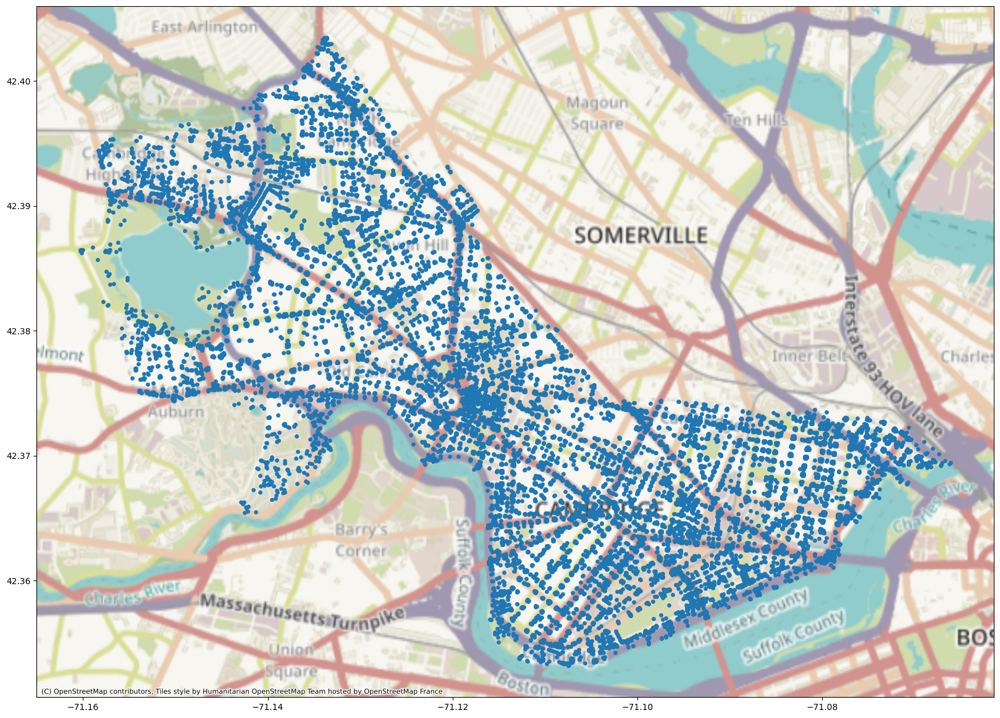

In [1]:
import osmnx as ox
from shapely import Point
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

plt.rcParams['figure.figsize'] = (20, 20)
S = 15

G = ox.graph_from_place('Cambridge, Massachusetts, United States')

points = [Point((G.nodes[i]['x'], G.nodes[i]['y'])) for i in G.nodes]
geo_df = gpd.GeoDataFrame(geometry = points, crs='EPSG:4326')

plot = geo_df.plot(markersize=S)
cx.add_basemap(plot, crs=geo_df.crs.to_string())

### K-Means Clustering
Next, we'll run k-means clustering on the dataset (specifically the spatial locations of the nodes) using the `sklearn` implementation. Feel free to play with the number of clusters or any other parameters noted in the [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html). 

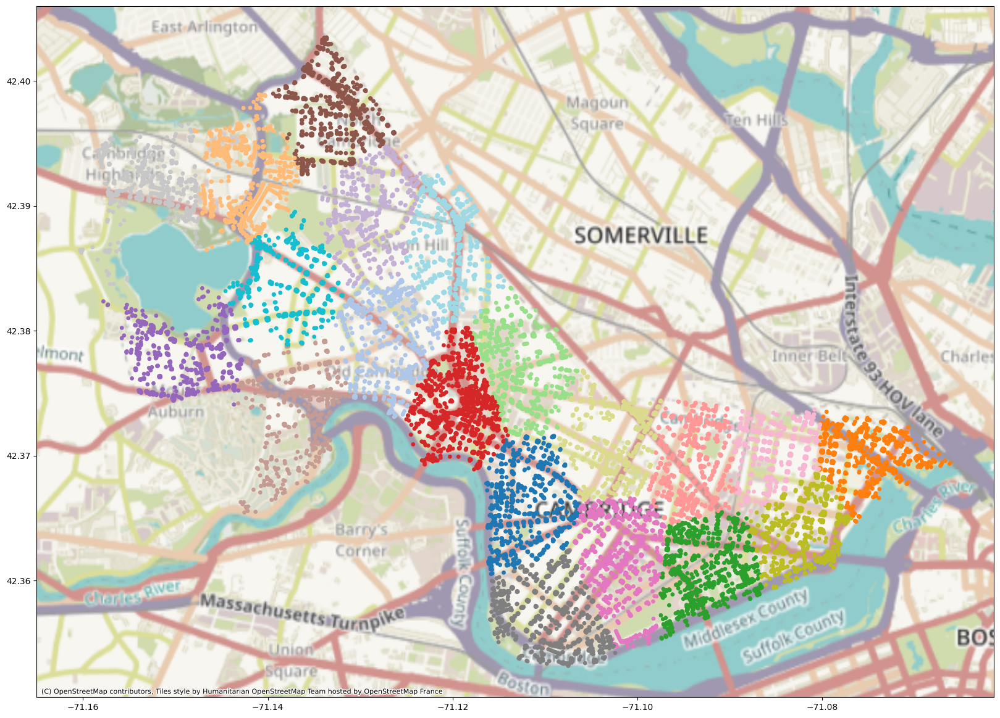

In [2]:
import matplotlib
import numpy as np
from sklearn.cluster import KMeans

K = 20

mtx = np.array([[G.nodes[i]['x'], G.nodes[i]['y']] for i in G.nodes])
kmeans = KMeans(n_clusters=K).fit(mtx)

cmap = plt.get_cmap('tab20')
geo_df["label"] = [matplotlib.colors.rgb2hex(cmap(i)) for i in kmeans.labels_]
plot = geo_df.plot(
    markersize=S,
    c=geo_df["label"], 
)
cx.add_basemap(plot, crs=geo_df.crs.to_string())

## Network-Based Clustering
What happens if we now try to cluster our network based on its adjacency matrix? We can use k-means again to see what happens!

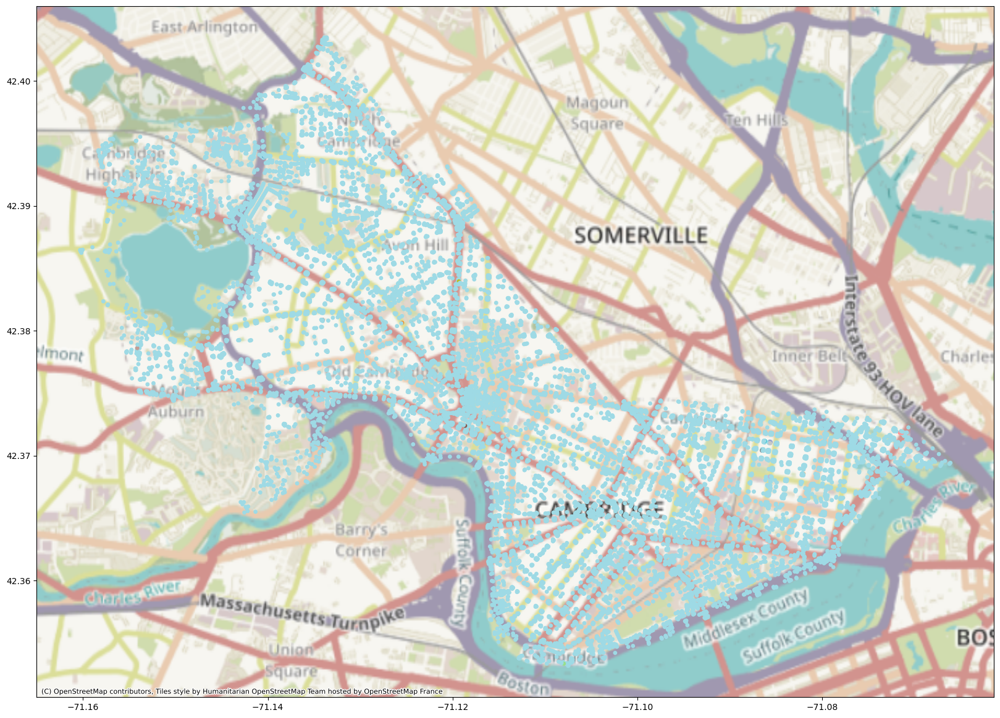

In [3]:
import networkx as nx
import scipy

K = 20
for u,v,d in G.edges(data=True):
    d['inverse_length'] = 1.0 / d['length']
A = nx.adjacency_matrix(G, weight='inverse_length')

A.indices = A.indices.astype(np.int32)
A.indptr = A.indptr.astype(np.int32)
adj_inv_length_kmeans = KMeans(n_clusters=K).fit(scipy.sparse.csr_matrix(A))
cmap = plt.get_cmap('tab20')
geo_df["label_adj_inv_length"] = [matplotlib.colors.rgb2hex(cmap(i)) for i in adj_inv_length_kmeans.labels_]
plot = geo_df.plot(
    markersize=S,
    c=geo_df["label_adj_inv_length"], 
)
cx.add_basemap(plot, crs=geo_df.crs.to_string())

In [4]:
import collections
collections.Counter(adj_inv_length_kmeans.labels_)

Counter({19: 16754,
         7: 4,
         1: 3,
         0: 3,
         8: 2,
         13: 1,
         2: 1,
         4: 1,
         12: 1,
         17: 1,
         14: 1,
         3: 1,
         9: 1,
         6: 1,
         15: 1,
         5: 1,
         16: 1,
         11: 1,
         18: 1,
         10: 1})

Okay, this method didn't work great for this dataset. Why might that be? First of all, k-means assumes spherical-ish data. It doesn't work great for data that's high-dimensional, sparse, and not linearly separable, all of which likely applies to our adjacency matrix. So if we want to incorporate network structure into our clustering of Cambridge, we're going to have to dig a bit deeper.

## Spectral Clustering
In spectral clustering, we start off (conveniently enough) with an adjacency (or similarity) matrix, $A$. We then calculate the Laplacian $L$ of $A$. The Laplacian is defined as $D - A$, where $D$ is the degree matrix (each node's degree is on the diagonal) and $A$ is our adjacency matrix (or matrix of weights, if we're using a weighted graph). Next, we calculate the first $k$ eigenvectors of the Laplacian and make a matrix consisting of those first $k$ eigenvectors. Each node $i$ in the graph is now represented by a vector of length $k$. We can then cluster these shorter vectors using k-means and find our cluster labels. 

One way we can think about spectral clustering is that we're doing random walks on the graph represented by $A$. We want to define our clusters such that a random walker will stay for a long time in a particular cluster and won't jump between clusters very often. We can also think of it as obtaining minimal graph cuts between partitions (see [this article](https://people.csail.mit.edu/dsontag/courses/ml14/notes/Luxburg07_tutorial_spectral_clustering.pdf) by von Luxberg (2007) for more information). 

Let's see how spectral clustering does on our city network!

/courses/PHYS7332.202510/shared/sad-ml/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:310: UserWarning: Array is not symmetric, and will be converted to symmetric by average with its transpose.
  adjacency = check_symmetric(adjacency)


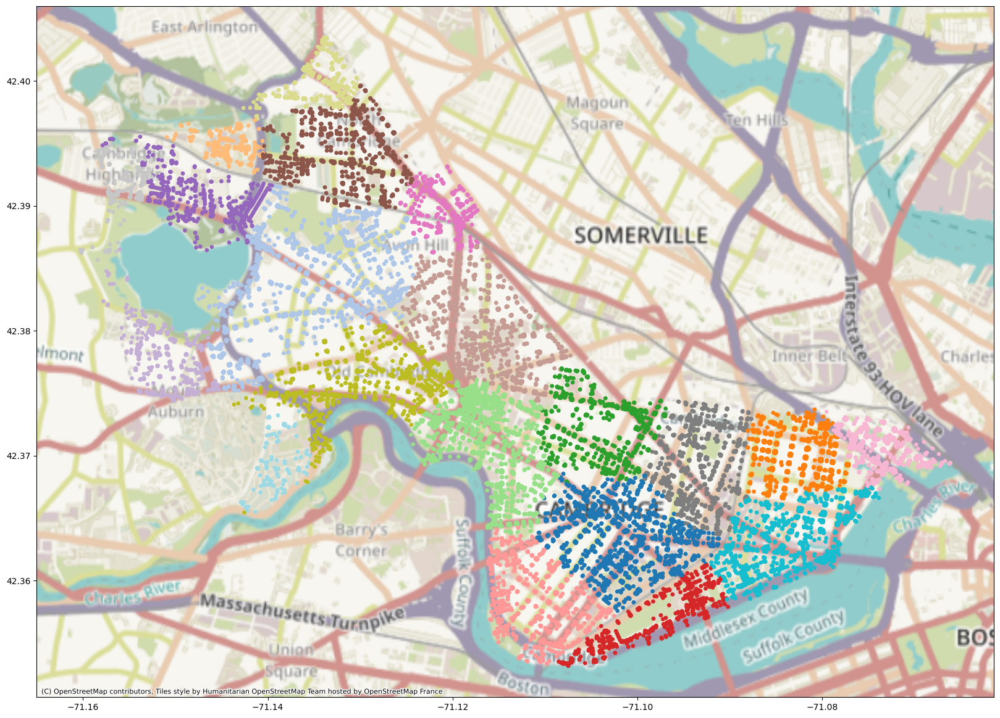

In [5]:
from sklearn.cluster import SpectralClustering

K = 20
for u,v,d in G.edges(data=True):
    d['inverse_length'] = 1.0 / d['length']
A = nx.adjacency_matrix(G, weight='inverse_length')

A.indices = A.indices.astype(np.int32)
A.indptr = A.indptr.astype(np.int32)
spectral = SpectralClustering(n_clusters=K, affinity='precomputed').fit(scipy.sparse.csr_matrix(A))
cmap = plt.get_cmap('tab20')
geo_df["label_spectral"] = [matplotlib.colors.rgb2hex(cmap(i)) for i in spectral.labels_]
plot = geo_df.plot(
    markersize=S,
    c=geo_df["label_spectral"], 
)
cx.add_basemap(plot, crs=geo_df.crs.to_string())

This partition is somewhat different from the k-means partition in that it separates out MIT's campus very neatly from the rest of Cambridge. The cluster boundaries here are also not necessarily polygons; k-means does something called [Voronoi tesselation](https://en.wikipedia.org/wiki/Voronoi_diagram), where it partitions a space into cells, each of which contains all the points that are closer to a particular centroid than to any other centroid. 

### What Are We Doing? It's Dimensionality Reduction!
When we have high-dimensional data (like an adjacency matrix or user purchasing records), sometimes we want to reduce its dimensionality to better understand what we're dealing with. There are several ways to do this -- getting the eigenvectors of the Laplacian is one way, but we could also run [PCA](https://en.wikipedia.org/wiki/Principal_component_analysis) (principal component analysis) or other linear algebra-based dimensionality reduction algorithms. We'll talk about fancier ways to reduce our data's dimensionality in the next section.

## Newer Unsupervised ML
### Embeddings
When we talk about making **embeddings**, we're talking about representing our data points or objects in our dataset as meaningful vectors. In graphs, and in natural language, we *could* represent nodes and words as sparse vectors. These might look like the sparse vectors we saw in the previous crappy example, where we ran k-means clustering on the adjacency matrix, or they might look like one-hot representations whose length is equal to the cardinality of a language's entire vocabulary. Of course, representations like these aren't very useful when we think about looking at questions of similarity or really any sort of machine learning applications. 

Enter **embeddings**. Embeddings can result from dimensionality reduction techniques like principal component analysis (PCA), but nowadays, when we think about embeddings, we tend to think about vectors that are created via training a neural network model to do a task. 

### Neural Networks
(this section borrows heavily from the coverage of ML in Bagrow & Ahn, section 16.2)

These can seem complicated to understand, but they, are at their heart, just doing a bunch of very parallelizable matrix operations. Here's a picture of a simple **feed-forward** neural network, sourced from this handy [Medium post](https://medium.com/analytics-vidhya/in-depth-explanation-of-feedforward-in-neural-network-mathematically-448092216b63). 

![feed-forward NN](https://miro.medium.com/v2/resize:fit:3200/1*ycDUAMaxDYaHx7xl9pqEjg.png)

Neural networks consist of sets of units (neurons) arranged in a sequence of layers. When we talk about the **architecture** of a neural network, we're talking about how the units are arranged, how many of them there are, how many layers we have, and the number of units per layer. In a fully connected feed-forward network, each unit in each layer is connected to all the nodes in the layer after it. First, the input nodes (the green ones) receive the input data (this could be attributes of a product, for example). Data moves through the network in the picture from left to right. The output of a particular unit is the activation function of the weighted sum of its inputs ($\sigma(\vec{w}^T \vec{x})$), where $\vec{w}$ is the weights of the inputs for that unit, and $\vec{x}$ is the inputs coming from the previous layer. $\sigma$ is the nonlinear activation function; in this case, we're probably thinking of the sigmoid function (pictured below & sourced [here](https://groups.csail.mit.edu/medg/hamish/medcomp3/sld007.htm)), but other activation functions, like $\tanh$, are possible as well (image sourced [here](https://sebastianraschka.com/faq/docs/activation-functions.html).

![sigmoid](https://groups.csail.mit.edu/medg/hamish/medcomp3/img007.gif)

![activations](https://sebastianraschka.com/images/faq/activation-functions/activation-functions.png)

The outputs we get from each unit in the middle layer then are passed to the final layer, and then we compare the final layer's output to our desired output. Maybe the $\vec{y}$ outputs in the picture are probabilities of the product belonging to a particular class, for example. Our task is to use a **loss function**, of which there are many, to express how far off we are from our correct answer. Once we've done that, we can use an algorithm called **backpropagation** to nudge the weights ($\vec{w}$) towards values that would be closer to producing the desired label. 

Our choice of loss function is important here; what works well for classifying products may be terrible for predicting flight prices, for example. For a more complete primer on loss functions, check out [this blog post](https://www.geeksforgeeks.org/loss-functions-in-deep-learning/). Generally, your loss function and the tasks you're setting up the neural network to learn will reflect what you want your neural network to do effectively. We might use a squared error loss function if we're predicting flight prices, and we might use a cross-entropy loss function to quantify how incorrect our predictions are for a classifier. There are more complicated loss functions and task setups, one of which we'll discuss in the next section. 

### \*tovec
#### Word2Vec
[Word2Vec](https://arxiv.org/pdf/1301.3781) was a pretty early natural language processing technique that was very exciting at the time. It trained a fairly simple neural network to do one of two tasks: Continuous Bag-of-Words (CBOW) or Skip-Gram. CBOW involves predicting which word is missing from a given context of surrounding words, and Skip-Gram involves doing the opposite: predicting the surrounding context given a specific word. The loss function here is cross-entropy loss; we use a softmax activation function to turn the outputs of the final layer into a probability distribution and then use cross-entropy loss to quantify how incorrect we were. Here's some more info; the links are where we sourced our images for [softmax](https://gombru.github.io/2018/05/23/cross_entropy_loss/) and [word2vec](https://devopedia.org/word2vec).

![word2vec tasks](https://devopedia.org/images/article/221/9279.1570465016.png)

![softmax + cross-entropy](https://gombru.github.io/assets/cross_entropy_loss/softmax_CE_pipeline.png) 


#### Node2Vec
[Node2Vec](https://arxiv.org/pdf/1607.00653) follows similar logic to Word2Vec. We do random walks through a network and treat these random walks like sentences. Then we can do CBOW or Skip-Gram to obtain node embeddings. At each iteration, Node2Vec samples $n * r$ random walks (with $r$ walks starting at each node). It has hyperparameters that influence how much we revisit nodes ($p$) and how much we favor visiting close nodes versus nodes that are further from where we started ($q$). 

When people around the time of Node2Vec were thinking about building node embeddings, they tended to consider homophily (nodes that are linked are likely to be similar) or structural equivalence (nodes with similarly structured neighborhoods are likely to be similar). Random walks that are closer to depth-first search tend to get further away from their start node, so they'll have a better sense of the community structure of a given graph and we'll get more information about node homophily (in theory). However, longer-range dependencies can be harder to make sense of and more complicated. If we instead do something more like a breadth-first search, we're thinking more about structural equivalence -- whose neighborhoods looks similar? This isn't likely to explore more distant parts of the graph, and nodes will repeat themselves a lot in a given walk. So Grover & Leskovec structured their random walks with hyperparameters $p$ and $q$ that allow us to figure out where on the BFS - DFS spectrum we want to end up. 

Our non-normalized probability $\alpha(v, x) * w(v, x)$ of visiting a given node $x$ after having visited $v$ in the previous step is:
$$
\alpha(v, x) = 
\begin{cases}
\frac{1}{p} & if d(v, x) = 0 \\
1 & if d(v, x) = 1 \\
\frac{1}{q} & if d(v, x) = 2
\end{cases}
$$

where $d(i, j)$ is the number of hops between node $i$ and node $j$. 

Here's an image from the original Node2Vec paper of the different outcomes of Node2Vec on a network generated from the novel *Les Misérables* with hyperparameter settings that lean more towards prioritizing homophily (closer to DFS) and structural equivalence (closer to BFS).

![lesmis](./images/les_mis_node2vec.png)

Node2Vec also incorporates **negative sampling**, where we only look at the outputs for a couple nodes that definitely **shouldn't** be in an input node's neighborhood. We make sure our outputs for those nodes are zero and do backpropagation accordingly; it's possible to tune how many negative samples we do for each positive sample. Adding negative samples improves our model's performance, and it's relatively cheap to do because we're not tuning all the weights in the model at once. 

We can do a version of Node2Vec where we're making embeddings for embeddings' sake, as we do in this setting, or we can try to train a classifier on Node2Vec embeddings to predict labels for nodes. Here we're going to train Node2Vec (without node or edge labels) on the Cambridge, MA network data. Let's see what happens! Our training code is borrowed from `pytorch-geometric` and can be found [here](https://github.com/pyg-team/pytorch_geometric/blob/master/examples/node2vec.py).

## On Training Neural Networks
We're going to use [`pytorch`](https://pytorch.org/) and [`pytorch-geometric`](https://pytorch-geometric.readthedocs.io/en/latest/) to make our neural network construction relatively pain-free. Pytorch is a widely used package for building & training neural networks. It's compatible with CUDA-capable GPUs (CUDA is Nvidia's deep learning framework that makes doing ML in GPUs possible). 

### GPUs
GPUs, or *graphical processing units*, are great at doing a lot of tiny calculations at the same time. This is different from CPUs, which are good at doing a few big calculations at once (this is a vast oversimplification, but it's good enough for an overview). Neural networks do a lot of vector and matrix multiplication (Remember those dot products from before? How do they scale up to a whole layer?) which is very easy to parallelize on a GPU. We're using GPUs today to speed up our Node2Vec training, which would be pretty slow on a CPU. 

### Train/Validation/Test Sets
A lot of the time, when we train a model (this goes for all models, not just neural network models!) we're worried about **overfitting**. Overfitting happens when your model learns the data it's trained on too well -- it's too accustomed to the training data and doesn't generalize well to new data. We might have too many parameters in our model, such that it's able to memorize the quirks of the training set too well, or we might've selected our training set improperly.

I once saw an example from a talk about explainability where scientists trained a model to guess where a Google StreetView photo was taken; it did really well on images taken at the same time as other images in the training set and really poorly on images taken at a later date. Turns out that the model was memorizing how windshield smudges changed over time and correlated the state of the windshield smudges to the car's location. So when the smudges changed (but the landscape didn't), the model was not able to identify the locations anymore. 

We usually split our data into 3 sets -- training, validation, and test. We use our **training** set to train the model; the **validation** set is used to figure out which choice of hyperparameters (like learning rate, optimizer, network size, etc.) works best for the dataset & model; and the **testing** set is for figuring out how well the finalized model does. The model **never** trains on the validation or testing data - it only updates itself based on the training data. A good rule of thumb is to use 10-15% of data for validation, 15-20% of the data for testing, and the rest for training. You should randomly split up your data such that the training, testing, and validation sets have similar distributions. 

Here, though, we're just trying to build embeddings to demonstrate Node2Vec's capabilities, so we're not holding out any data right now. Node2Vec *does* sample negative examples as it trains, so that the model learns which contexts or nodes are correct and builds accurate embeddings. If we were training a link prediction model with Node2Vec, as you can choose to do at the end of this class, we would at minimum hold out some fraction of links to make sure our embeddings were of good quality and useful for the downstream link prediction task. 

### Hyperparameters
**Hyperparameters** are parameters that control how we find the neural network's weights (the non-hyper parameters, or just plain parameters). Examples of hyperparameters are learning rate, number of layers, choice of optimizer, layer size, and activation function(s). Finding good hyperparameters can take a lot of time, depending on the number and types of hyperparameters you're playing with; platforms like [Weights and Biases](https://wandb.ai/site) have sprung up to help developers tune hyperparameters for their neural network models. 

In [11]:
import torch
import sys

from torch_geometric.data import Data
from torch_geometric.nn import Node2Vec 

# giving nodes new indices, as Node2Vec expects indices to start at 0 and end at |N| - 1. 
for idx, node in enumerate(G.nodes):
    G.nodes[node]['idx'] = idx

# build a tensor with all the edges in the graph. 
my_tensor = []
for e in G.edges:
    my_tensor.append([G.nodes[e[0]]['idx'], G.nodes[e[1]]['idx']])

# actually convert it to a torch Tensor -- 
# this has to be a torch datatype or it will not play nicely with the GPU.
edge_list = torch.Tensor(my_tensor).T.to(torch.long)

# checking if we have a CUDA-capable GPU available.
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

# constructing our Node2Vec model and giving it our edge list as input. 
# note that you can tweak all of these parameters!
model = Node2Vec(
    edge_list,
    embedding_dim=32,
    walk_length=20,
    context_size=10,
    walks_per_node=10,
    num_negative_samples=1,
    p=1.0,
    q=1.0,
    sparse=True,
).to(device)

# we have 2 CPU cores requested by default in our sessions. 
# (we use CPU cores to load our data).
num_workers = 2 if sys.platform == 'linux' else 0

# we use batches to work through our dataset without overloading the GPU.
loader = model.loader(batch_size=128, shuffle=True, num_workers=num_workers)
# you can play with optimizer choices; Adam and AdaGrad are popular choices.
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

for epoch in range(1, 101): # an epoch refers to going over all the data once
    model.train() # set the model to training mode; 
    # this lets it accumulate gradients and do backpropagation
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad() # zero out the gradients to start fresh
        loss = model.loss(pos_rw.to(device), neg_rw.to(device)) 
        # compute the loss (cross-entropy)
        loss.backward() # do backpropagation
        optimizer.step() # updates the parameters
        total_loss += loss.item() # keeps track of our total loss (it should decrease over time)
    loss = total_loss / len(loader) # how wrong are we on average?
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}') # keep track of our progress

cuda
Epoch: 001, Loss: 2.9646
Epoch: 002, Loss: 1.5299
Epoch: 003, Loss: 1.1161
Epoch: 004, Loss: 0.9574
Epoch: 005, Loss: 0.8835
Epoch: 006, Loss: 0.8442
Epoch: 007, Loss: 0.8218
Epoch: 008, Loss: 0.8073
Epoch: 009, Loss: 0.7979
Epoch: 010, Loss: 0.7913
Epoch: 011, Loss: 0.7869
Epoch: 012, Loss: 0.7838
Epoch: 013, Loss: 0.7814
Epoch: 014, Loss: 0.7797
Epoch: 015, Loss: 0.7784
Epoch: 016, Loss: 0.7775
Epoch: 017, Loss: 0.7768
Epoch: 018, Loss: 0.7759
Epoch: 019, Loss: 0.7756
Epoch: 020, Loss: 0.7751
Epoch: 021, Loss: 0.7748
Epoch: 022, Loss: 0.7747
Epoch: 023, Loss: 0.7744
Epoch: 024, Loss: 0.7742
Epoch: 025, Loss: 0.7740
Epoch: 026, Loss: 0.7739
Epoch: 027, Loss: 0.7736
Epoch: 028, Loss: 0.7735
Epoch: 029, Loss: 0.7730
Epoch: 030, Loss: 0.7729
Epoch: 031, Loss: 0.7728
Epoch: 032, Loss: 0.7729
Epoch: 033, Loss: 0.7722
Epoch: 034, Loss: 0.7725
Epoch: 035, Loss: 0.7723
Epoch: 036, Loss: 0.7720
Epoch: 037, Loss: 0.7717
Epoch: 038, Loss: 0.7716
Epoch: 039, Loss: 0.7715
Epoch: 040, Loss: 0.

In [13]:
model.eval() 
# set model to eval mode - this means it doesn't accumulate gradients
# and uses way less memory
z = model() # get embeddings
z_cpu = z.to('cpu').detach().numpy() 
# put these on the CPU and detach it from the neural network. 

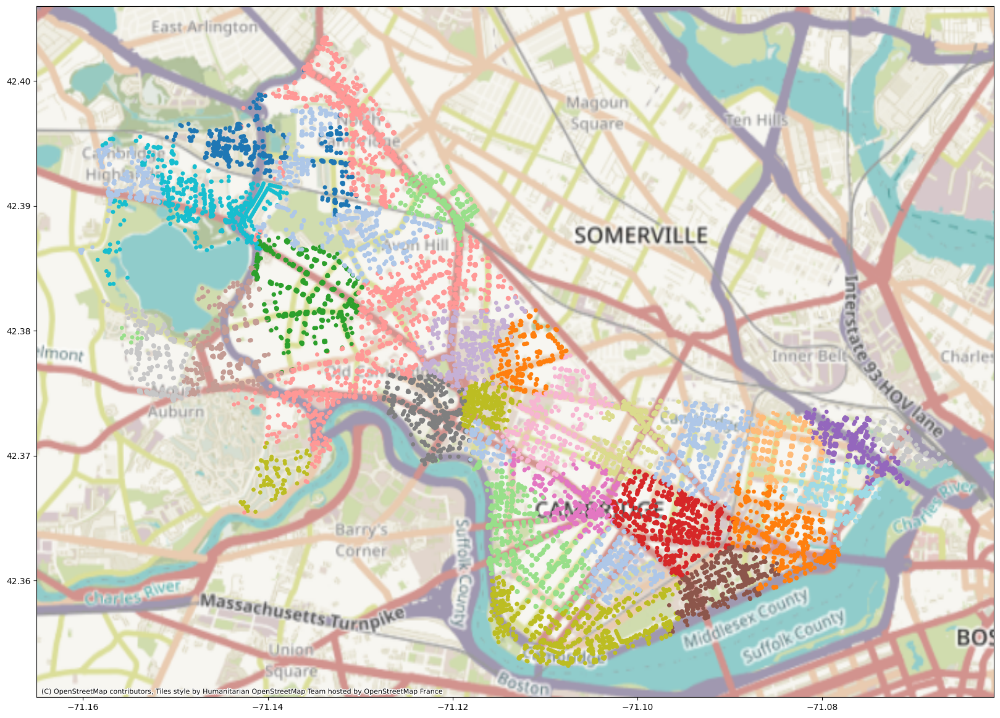

In [14]:
import contextily as cx
plt.rcParams['figure.figsize'] = (20, 20)
adj_inv_length_kmeans = KMeans(n_clusters=20).fit(z_cpu)
geo_df["label_adj_inv_length"] = [matplotlib.colors.rgb2hex(cmap(i)) for i in adj_inv_length_kmeans.labels_]
plot = geo_df.plot(
    markersize=S,
    c=geo_df["label_adj_inv_length"], 
)
cx.add_basemap(plot, crs=geo_df.crs.to_string())

## Your Turn: Choose Your Own Adventure!
We're now going to spend some time playing with Node2Vec. There are two tasks you can try tackling; the first one has to do with perturbation sensitivity, and the second one involves link prediction. 

### Perturbation Sensitivity
If you're interested in exploring the limits of Node2Vec qualitatively and playing around with the network, this is the right task for you! Try randomly removing some percentage of edges from the original network, and then redo the embeddings. What does the new map look like? At what point do the embeddings start to degrade, and how do you know they've degraded? Feel free to try this experiment on an area you know well so that you can apply your intuition more easily. You can also try adding random edges to the network instead of removing random edges and repeat this experiment. 

### Link Prediction
If you're interested in trying out a bit of link prediction and playing with Node2Vec's parameters, this challenge is for you! Try randomly removing some percentage of edges from the original network, and make the embeddings. Keep track of the edges you've removed; these will be your positive examples. Then, create about the same number of negative examples (edges that did not appear in the original network). This will be your evaluation set. Using this evaluation set, build a classifier (a [random forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) might be a good start) that takes two nodes' embeddings from Node2Vec as input (i.e. concatenates the embeddings for both endpoints of an edge) and learns to predict whether the edges are in the graph. Run [cross-validation](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html) with this classifier and let us know how it does. You can try varying hyperparameters like the learning rate or the percent of edges you remove. 

In [15]:
# Your Turn!

In [9]:
import numpy as np

SPLIT = 0.25 # fraction of held-out (removed) edges

valid_edges = set()
my_tensor_split = []
held_out_edges = []

for e in G.edges:
    idx0 = G.nodes[e[0]]['idx']
    idx1 = G.nodes[e[1]]['idx']
    valid_edges.add((idx0, idx1))
    if np.random.uniform() > SPLIT:
        my_tensor_split.append([idx0, idx1])
    else:
        held_out_edges.append([idx0, idx1])
        
edge_list_split = torch.Tensor(my_tensor_split).T.to(torch.long)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)
model = Node2Vec(
    edge_list_split,
    embedding_dim=32,
    walk_length=20,
    context_size=10,
    walks_per_node=10,
    num_negative_samples=1,
    p=1.0,
    q=1.0,
    sparse=True,
).to(device)

num_workers = 2 if sys.platform == 'linux' else 0
loader = model.loader(batch_size=128, shuffle=True, num_workers=num_workers)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

for epoch in range(1, 51):
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    loss = total_loss / len(loader)
    print(f'Epoch: {epoch:03d}, Loss: {loss:.4f}')

z_split = model()
z_cpu_split = z_split.to('cpu').detach().numpy()

cuda
Epoch: 001, Loss: 2.7818
Epoch: 002, Loss: 1.4846
Epoch: 003, Loss: 1.0998
Epoch: 004, Loss: 0.9482
Epoch: 005, Loss: 0.8781
Epoch: 006, Loss: 0.8401
Epoch: 007, Loss: 0.8175
Epoch: 008, Loss: 0.8029
Epoch: 009, Loss: 0.7930
Epoch: 010, Loss: 0.7861
Epoch: 011, Loss: 0.7811
Epoch: 012, Loss: 0.7774
Epoch: 013, Loss: 0.7747
Epoch: 014, Loss: 0.7726
Epoch: 015, Loss: 0.7709
Epoch: 016, Loss: 0.7697
Epoch: 017, Loss: 0.7688
Epoch: 018, Loss: 0.7680
Epoch: 019, Loss: 0.7674
Epoch: 020, Loss: 0.7668
Epoch: 021, Loss: 0.7664
Epoch: 022, Loss: 0.7661
Epoch: 023, Loss: 0.7656
Epoch: 024, Loss: 0.7653
Epoch: 025, Loss: 0.7654
Epoch: 026, Loss: 0.7652
Epoch: 027, Loss: 0.7649
Epoch: 028, Loss: 0.7649
Epoch: 029, Loss: 0.7647
Epoch: 030, Loss: 0.7645
Epoch: 031, Loss: 0.7642
Epoch: 032, Loss: 0.7642
Epoch: 033, Loss: 0.7641
Epoch: 034, Loss: 0.7637
Epoch: 035, Loss: 0.7638
Epoch: 036, Loss: 0.7637
Epoch: 037, Loss: 0.7634
Epoch: 038, Loss: 0.7634
Epoch: 039, Loss: 0.7632
Epoch: 040, Loss: 0.

In [14]:
fake_edges = set()

while len(fake_edges) < len(held_out_edges):
    pr = (np.random.randint(len(G.nodes)), np.random.randint(len(G.nodes)))
    if pr in valid_edges or pr in fake_edges or pr[0] == pr[1]:
        pass
    else:
        fake_edges.add(pr)

fake_edges = list(fake_edges)
edge_embeddings = []
ground_truths = [1] * len(held_out_edges) + [0] * len(fake_edges)
for edge in held_out_edges + fake_edges:
    vec = np.hstack((z_cpu_split[edge[0]], z_cpu_split[edge[1]]))
    edge_embeddings.append(vec)

In [17]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier()
scores = cross_val_score(clf, np.array(edge_embeddings), np.array(ground_truths), cv=2)


In [18]:
scores

array([0.86991675, 0.94148255])